<a href="https://colab.research.google.com/github/Redbeard-himalaya/retinaface/blob/0.0.8-dev/retinaface_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#apt -qq install -y libgl1-mesa-glx libglib2.0-0 > /dev/null && \
!pip install -q -q -q cached-path --no-cache-dir 2>&1 > /dev/null && \
 mkdir /retinaface && cd /retinaface && \
 wget -qO- https://github.com/Redbeard-himalaya/retinaface/archive/refs/tags/v0.0.8-dev.tar.gz | tar xzf - -C ./ --strip-components=1 && \
 pip install -q -q -q -e . && \
 wget -O /content/crowd.jpg https://habrastorage.org/webt/tj/gk/ch/tjgkch5v0x-tubycgzp3pfbrtas.jpeg > /dev/null

import sys
sys.path.append("/retinaface")

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cudnn-cu12==8.9.2.26; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cufft-cu12==11.0.2.54; platform_system == "Linux" and platform_machi

# Legacy Single Mode Test

In [2]:
! cp ./*.py /retinaface/retinaface/

In [9]:
from time import perf_counter
from pathlib import Path
import cv2
from retinaface.pre_trained_legacy_models import get_model
from retinaface.utils import vis_annotations
image = cv2.imread("crowd.jpg")
# image = cv2.imread("Z-pNk1hPMKM.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
model = get_model(model_name="resnet50_2020-07-20",
                  max_size=2048,
                  quiet=False,
                  model_dir=Path('retinaface/cache'),
                  device="cuda")
model.eval()

In [ ]:
%%bash --bg
nvidia-smi -l 1 --format=csv --query-gpu=index,name,persistence_mode,utilization.gpu,utilization.memory > gpu.log

cost: 4.718345499000009

cost: 4.080946499999982


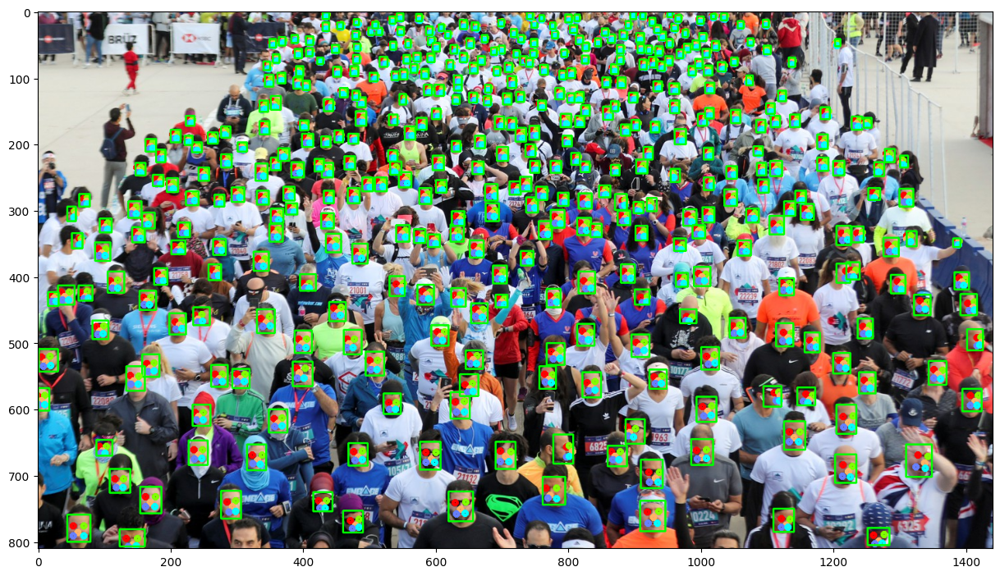

In [11]:
from matplotlib import pyplot as plt
loop = 10
ts = perf_counter()
for _ in range(loop):
    annotation = model.predict_jsons(image)
print(f"cost: {perf_counter() - ts}")

print()

ts = perf_counter()
for _ in range(loop):
    annotation = model.predict_jsons(image)
print(f"cost: {perf_counter() - ts}")

plt.rcParams["figure.figsize"] = (15, 15)
plt.imshow(vis_annotations(image, annotation))

import gc
import torch
gc.collect()
torch.cuda.empty_cache()

# Single Model Test

In [2]:
! cp ./*.py /retinaface/retinaface/

In [12]:
from time import perf_counter
from pathlib import Path
import cv2
from PIL import Image, ImageDraw
import torch
import torchvision.transforms as T
from torchvision.transforms.functional import to_pil_image, pil_to_tensor, to_tensor
from torch.nn import functional as F
from retinaface.pre_trained_models import get_model
from retinaface.utils import vis_annotations, process_predictions
from retinaface.extract import Extractor

image = cv2.imread("crowd.jpg") #("Z-pNk1hPMKM.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_path = './'
image_names = ["crowd.jpg"] #["Z-pNk1hPMKM.jpg"]
if len(image_names) > 1:
    imgs = [pil_to_tensor(Image.open(image_path + n).convert("RGB")) for n in image_names]
    imgs = torch.stack(imgs)
else:
    imgs = pil_to_tensor(Image.open(image_path + image_names[0]).convert("RGB"))
model = get_model(model_name="resnet50_2020-07-20",
                  max_size=2048,
                  batch_model=False,
                  quiet=False,
                  model_dir=Path('retinaface/cache'),
                  device="cuda",
)
model.eval()
imgs = imgs.to("cuda")
extract = Extractor(resize=160, margin=20)

In [ ]:
%%bash --bg
nvidia-smi -l 1 --format=csv --query-gpu=index,name,persistence_mode,utilization.gpu,utilization.memory > gpu.log

predict_jsons cost: 3.2703986167907715 f-cost 0.3270398676395416
extract       cost: 1.464396357536316 f-cost 0.14643964171409607
total         cost: 4.734795093536377 f-cost 0.4734795093536377


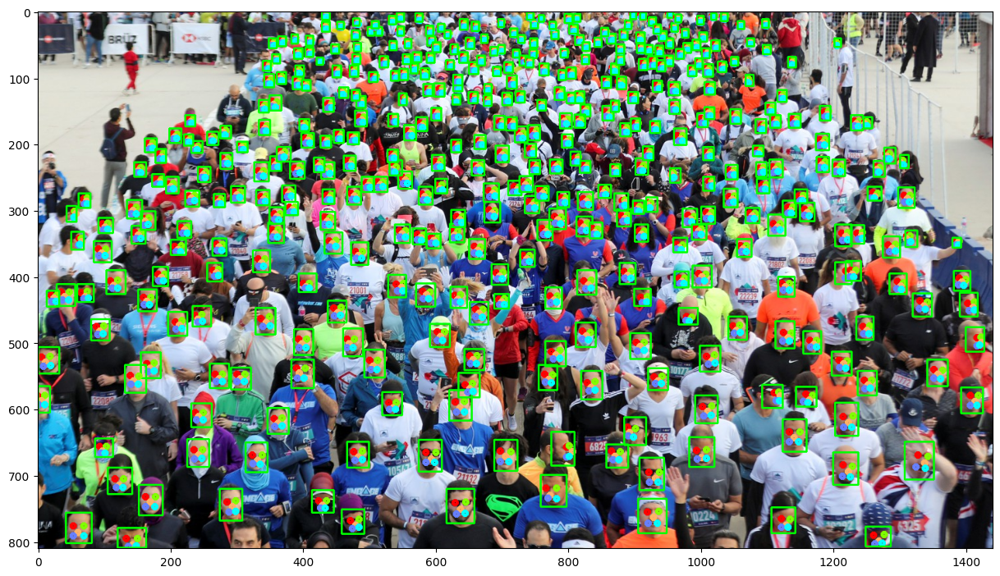

In [14]:
from matplotlib import pyplot as plt
batch_size = 10
costs = torch.zeros((batch_size, 3))
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
# torch.cuda.set_sync_debug_mode("warn")
for i, img in enumerate(images):
  ts_start = perf_counter()
  batches, boxes, landmarks, scores = model.predict_jsons(img)
  torch.cuda.synchronize()
  ts_predict_jsons = perf_counter()
  torch.cuda.empty_cache()
  faces = extract(images=images,
                  batch_ids=batches,
                  bboxes=boxes,
                  landmarks=landmarks)
  torch.cuda.synchronize()
  ts_extract = perf_counter()
  costs[i][0] = ts_predict_jsons - ts_start
  costs[i][1] = ts_extract - ts_predict_jsons
  costs[i][2] = ts_extract - ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"predict_jsons cost: {costs[:,0].sum()} f-cost {costs[:,0].mean()}")
print(f"extract       cost: {costs[:,1].sum()} f-cost {costs[:,1].mean()}")
print(f"total         cost: {costs[:,2].sum()} f-cost {costs[:,2].mean()}")


plt.rcParams["figure.figsize"] = (15, 15)
annotations = process_predictions(batch_num=images.shape[0],
                                  batches=batches,
                                  boxes=boxes,
                                  landmarks=landmarks,
                                  scores=scores)
plt.imshow(vis_annotations(image, annotations[0]))

import gc
del images, batches, boxes, landmarks, scores, faces
gc.collect()
torch.cuda.empty_cache()

cost: 0.34220824399994854
cost: 3.966139793395996 f-cost 0.3966139853000641


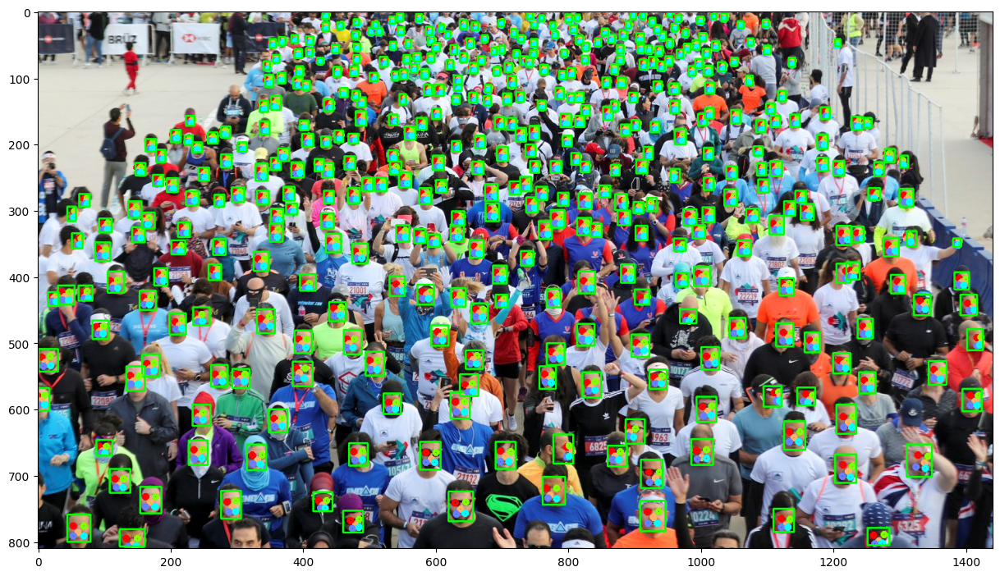

In [16]:
from matplotlib import pyplot as plt
batch_size = 1
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
# torch.cuda.set_sync_debug_mode("warn")
ts_start = perf_counter()
faces, boxes, landmarks, scores = model.predict(images[0])
torch.cuda.synchronize()
costs = perf_counter() - ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: {costs}")

batch_size = 10
costs = torch.zeros((batch_size))
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
img_ids = []
for i, img in enumerate(images):
  ts_start = perf_counter()
  faces, boxes, landmarks, scores = model.predict(img)
  img_ids.append(torch.LongTensor([i]).repeat(boxes.shape[0]))
  torch.cuda.synchronize()
  costs[i] = perf_counter() - ts_start
img_ids = torch.stack(img_ids)
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: {costs.sum()} f-cost {costs.mean()}")

plt.rcParams["figure.figsize"] = (15, 15)
boxes_copy = boxes.clone()
boxes_copy[:,2:] -= boxes_copy[:,:2]
annotations = process_predictions(batch_num=images.shape[0],
                                  batches=img_ids[0],
                                  boxes=boxes_copy,
                                  landmarks=landmarks,
                                  scores=scores)
plt.imshow(vis_annotations(image, annotations[0]))

import gc
del images, boxes, boxes_copy, landmarks, scores, faces
gc.collect()
torch.cuda.empty_cache()

# Batch Mode Test

In [1]:
! cp ./*.py /retinaface/retinaface/

In [2]:
from time import perf_counter
from pathlib import Path
import cv2
from PIL import Image, ImageDraw
import torch
import torchvision.transforms as T
from torchvision.transforms.functional import to_pil_image, pil_to_tensor, to_tensor
from torch.nn import functional as F
from retinaface.pre_trained_models import get_model
from retinaface.utils import vis_annotations, process_predictions
from retinaface.extract import Extractor

image = cv2.imread("crowd.jpg") #("Z-pNk1hPMKM.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_path = './'
image_names = ["crowd.jpg"] #["Z-pNk1hPMKM.jpg"]
if len(image_names) > 1:
    imgs = [pil_to_tensor(Image.open(image_path + n).convert("RGB")) for n in image_names]
    imgs = torch.stack(imgs)
else:
    imgs = pil_to_tensor(Image.open(image_path + image_names[0]).convert("RGB"))
model = get_model(model_name="resnet50_2020-07-20",
                  max_size=2048,
                  batch_height=imgs.shape[-2],
                  batch_width=imgs.shape[-1],
                  batch_model=True,
                  quiet=False,
                  model_dir=Path('retinaface/cache'),
                  device="cuda",
)
model.eval()
imgs = imgs.to("cuda")
extract = Extractor(resize=160, margin=20)

In [ ]:
%%bash --bg
nvidia-smi -l 1 --format=csv --query-gpu=index,name,persistence_mode,utilization.gpu,utilization.memory > gpu.log

predict_jsons cost: 5.246222496032715 f-cost 0.16394445300102234
extract       cost: 5.050278186798096 f-cost 0.1578211933374405
total         cost: 10.296501159667969 f-cost 0.321765661239624

predict_jsons cost: tensor([2.0820, 2.0234, 2.0311]), avg 2.0454883575439453, f-cost 0.06392151117324829
extract       cost: tensor([2.7636, 1.9796, 1.9874]), avg 2.2435314655303955, f-cost 0.07011035829782486
total         cost: tensor([4.8457, 4.0030, 4.0184]), avg 4.28902006149292, f-cost 0.13403187692165375


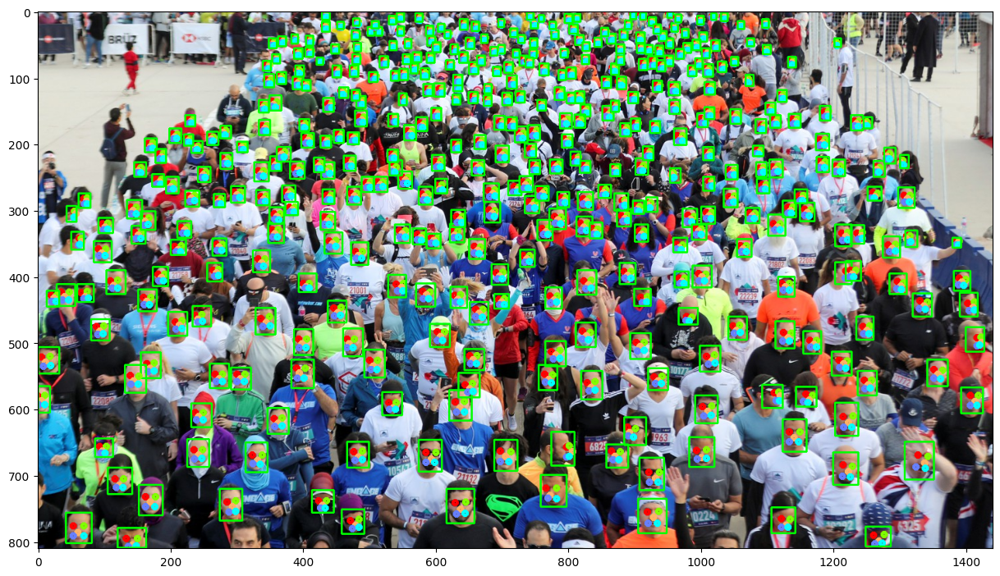

In [3]:
from matplotlib import pyplot as plt
costs = torch.zeros(3)
batch_size = 32
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
# torch.cuda.set_sync_debug_mode("warn")
ts_start = perf_counter()
batches, boxes, landmarks, scores = model.predict_jsons(images)
torch.cuda.synchronize()
ts_predict_jsons = perf_counter()
torch.cuda.empty_cache()
faces = extract(images=images,
                batch_ids=batches,
                bboxes=boxes,
                landmarks=landmarks)
torch.cuda.synchronize()
ts_extract = perf_counter()
costs[0] = ts_predict_jsons-ts_start
costs[1] = ts_extract-ts_predict_jsons
costs[2] = ts_extract-ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"predict_jsons cost: {costs[0]} f-cost {costs[0] / batch_size}")
print(f"extract       cost: {costs[1]} f-cost {costs[1] / batch_size}")
print(f"total         cost: {costs[2]} f-cost {costs[2] / batch_size}")
# print(f"inter_cost: {inter_cost[0]}")
# for i, v in enumerate(inter_cost[1:]):
#   print(f"inter_cost{i+1}: {v}")

print("")
iteration = 3
costs = torch.zeros((iteration, 3))
for i in range(iteration):
  ts_start = perf_counter()
  batches, boxes, landmarks, scores = model.predict_jsons(images)
  torch.cuda.synchronize()
  ts_predict_jsons = perf_counter()
  faces = extract(images=images,
                  batch_ids=batches,
                  bboxes=boxes,
                  landmarks=landmarks)
  torch.cuda.synchronize()
  ts_extract = perf_counter()
  costs[i, 0] = ts_predict_jsons-ts_start
  costs[i, 1] = ts_extract-ts_predict_jsons
  costs[i, 2] = ts_extract-ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"predict_jsons cost: {costs[:,0]}, avg {costs[:,0].mean()}, f-cost {costs[:,0].mean() / batch_size}")
print(f"extract       cost: {costs[:,1]}, avg {costs[:,1].mean()}, f-cost {costs[:,1].mean() / batch_size}")
print(f"total         cost: {costs[:,2]}, avg {costs[:,2].mean()}, f-cost {costs[:,2].mean() / batch_size}")
# print(f"inter_cost: {inter_cost[0]}")
# for i, v in enumerate(inter_cost[1:]):
#   print(f"inter_cost{i+1}: {v}")

plt.rcParams["figure.figsize"] = (15, 15)
annotations = process_predictions(batch_num=images.shape[0],
                                  batches=batches,
                                  boxes=boxes,
                                  landmarks=landmarks,
                                  scores=scores)
plt.imshow(vis_annotations(image, annotations[0]))

import gc
del images, batches, boxes, landmarks, scores, faces
gc.collect()
torch.cuda.empty_cache()

cost: 5.797857923000038 f-cost 0.12078870672916746

cost: tensor([5.7929, 5.7468, 5.7896]), avg 5.776449680328369, f-cost 0.12034270167350769


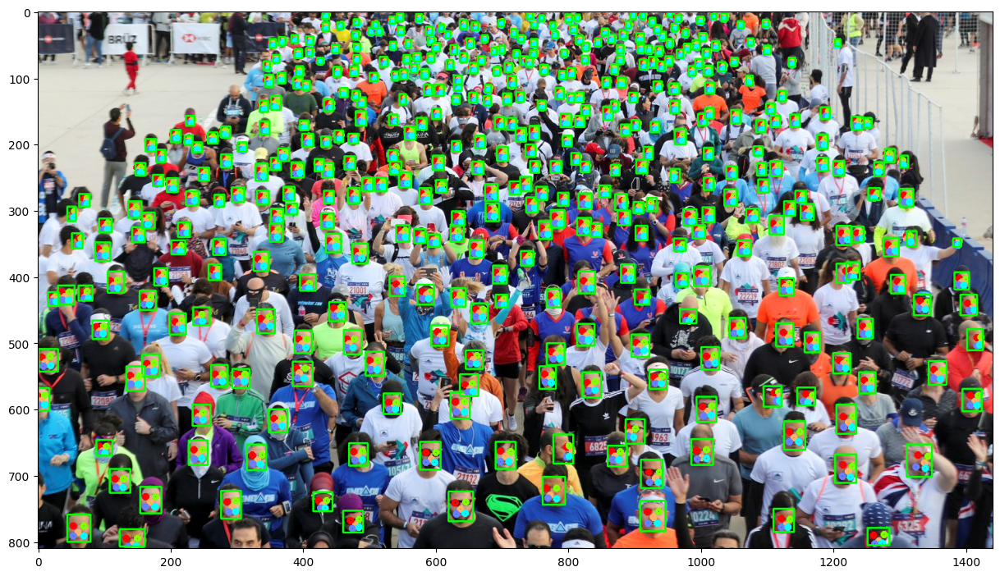

In [4]:
from matplotlib import pyplot as plt
batch_size = 48
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
# torch.cuda.set_sync_debug_mode("warn")
ts_start = perf_counter()
faces, batches, boxes, landmarks, scores = model.predict(images)
torch.cuda.synchronize()
costs = perf_counter() - ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: {costs} f-cost {costs / batch_size}")

print("")
iteration = 3
costs = torch.zeros((iteration))
for i in range(iteration):
  ts_start = perf_counter()
  faces, batches, boxes, landmarks, scores = model.predict(images)
  torch.cuda.synchronize()
  costs[i] = perf_counter() - ts_start
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: {costs}, avg {costs.mean()}, f-cost {costs.mean() / batch_size}")
# print(f"inter_cost: {inter_cost[0]}")
# for i, v in enumerate(inter_cost[1:]):
#   print(f"inter_cost{i+1}: {v}")

plt.rcParams["figure.figsize"] = (15, 15)
boxes_copy = boxes.clone()
boxes_copy[:,2:] -= boxes_copy[:,:2]
annotations = process_predictions(batch_num=images.shape[0],
                                  batches=batches,
                                  boxes=boxes_copy,
                                  landmarks=landmarks,
                                  scores=scores)
plt.imshow(vis_annotations(image, annotations[0]))

import gc
del images, batches, boxes, boxes_copy, landmarks, scores, faces
gc.collect()
torch.cuda.empty_cache()

/retinaface/retinaface/predict_batch.py:181: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  batch_ids, valid_indeces = torch.where(batch_scores > self.confidence_threshold)
/retinaface/retinaface/predict_batch.py:189: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  valid_index = valid_indeces[torch.where(batch_ids == batch_id)]
/retinaface/retinaface/predict_batch.py:219: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  if x_min < x_max and y_min < y_max
/retinaface/retinaface/predict_batch.py:215: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  "landmarks": landmark.tolist(),


cost: total 2.0589539059999993 avg 0.20589539059999992
inter_cost: 2.058514892578125
inter_cost1: 0.025158943176269533
inter_cost2: 1.6697574462890625
inter_cost3: 0.0012507840394973754
inter_cost4: 0.003633023977279663
inter_cost5: 9.07839983701706e-05
inter_cost6: 0.0004973120093345642
inter_cost7: 0.35812652587890625


cost: total 2.003082596000013 avg 0.2003082596000013
inter_cost: 2.0027269287109375
inter_cost1: 0.016429536819458006
inter_cost2: 1.6077537841796876
inter_cost3: 0.0012471679449081422
inter_cost4: 0.0036322879791259766
inter_cost5: 9.10400003194809e-05
inter_cost6: 0.0004177919924259186
inter_cost7: 0.3731553649902344


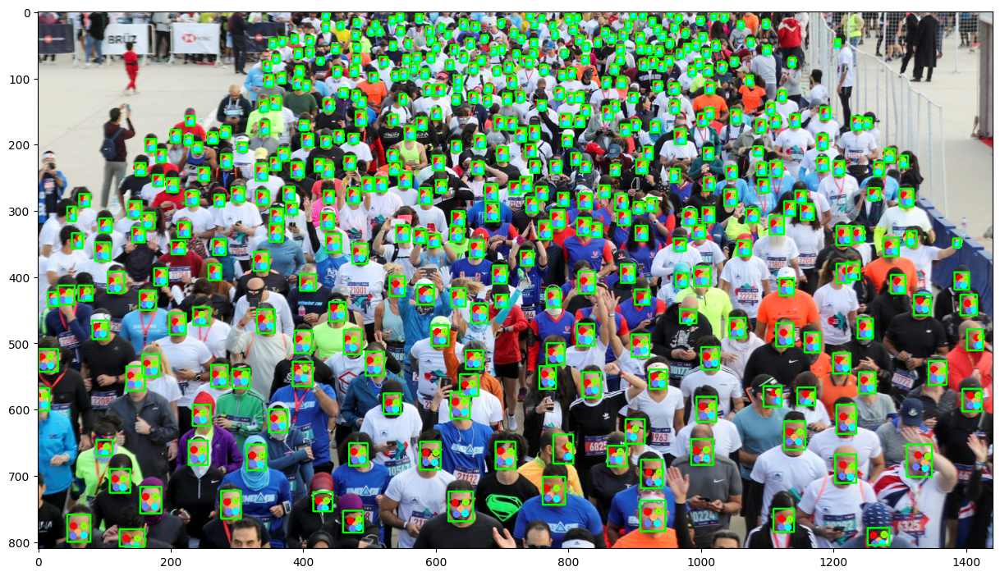

In [ ]:
from matplotlib import pyplot as plt
batch_size = 10
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
torch.cuda.set_sync_debug_mode("warn")
ts = perf_counter()
annotations, inter_cost = model.predict_jsons2(images)
cost = perf_counter() - ts
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: total {cost} avg {cost / batch_size}")
print(f"inter_cost: {inter_cost[0]}")
for i, v in enumerate(inter_cost[1:]):
  print(f"inter_cost{i+1}: {v}")

print("\n")

ts = perf_counter()
annotations, inter_cost = model.predict_jsons2(images)
cost = perf_counter() - ts
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: total {cost} avg {cost / batch_size}")
print(f"inter_cost: {inter_cost[0]}")
for i, v in enumerate(inter_cost[1:]):
  print(f"inter_cost{i+1}: {v}")

import gc
del images
gc.collect()
torch.cuda.empty_cache()

plt.rcParams["figure.figsize"] = (15, 15)
plt.imshow(vis_annotations(image, annotations[0]))

/retinaface/retinaface/predict_batch.py:259: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  batch_ids, valid_indeces = np.where(condition.cpu().numpy())
/retinaface/retinaface/predict_batch.py:270: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  scores = scores[valid_index]
/retinaface/retinaface/predict_batch.py:271: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  boxes = boxes[valid_index] * self.scale_bboxes
/retinaface/retinaface/predict_batch.py:280: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.)
  landmarks[valid_index][keep] * self.scale_landmarks * self.resize_coeff
/retinaface/retinaface/predict_batch.py:297: UserWarning: called a synchronizing CUDA operation (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:150.

cost: total 2.0783527950000007 avg 0.20783527950000008
inter_cost: 2.077906982421875
inter_cost1: 0.027679935455322265
inter_cost2: 1.6836014404296875
inter_cost3: 0.0012451839447021485
inter_cost4: 0.0036248319149017336
inter_cost5: 0.00013529600203037262
inter_cost6: 0.004594624042510986
inter_cost7: 0.3570258178710938


cost: total 2.0966970029999743 avg 0.20966970029999743
inter_cost: 2.096271484375
inter_cost1: 0.01689049530029297
inter_cost2: 1.6159554443359376
inter_cost3: 0.0012479360103607178
inter_cost4: 0.003625119924545288
inter_cost5: 0.00013523200154304504
inter_cost6: 0.0034641919136047363
inter_cost7: 0.4549532165527344


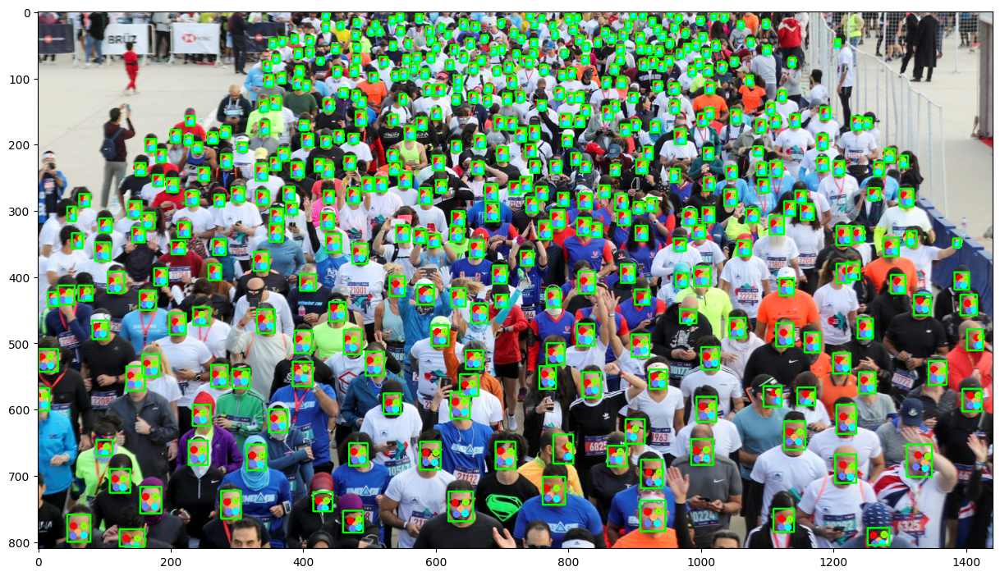

In [ ]:
from matplotlib import pyplot as plt
batch_size = 10
images = imgs[None,:,:,:].expand(batch_size, -1, -1, -1)
torch.cuda.set_sync_debug_mode("warn")
ts = perf_counter()
annotations, inter_cost = model.predict_jsons_np(images)
cost = perf_counter() - ts
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: total {cost} avg {cost / batch_size}")
print(f"inter_cost: {inter_cost[0]}")
for i, v in enumerate(inter_cost[1:]):
  print(f"inter_cost{i+1}: {v}")

print("\n")

ts = perf_counter()
annotations, inter_cost = model.predict_jsons_np(images)
cost = perf_counter() - ts
# torch.cuda.set_sync_debug_mode("default")
print(f"cost: total {cost} avg {cost / batch_size}")
print(f"inter_cost: {inter_cost[0]}")
for i, v in enumerate(inter_cost[1:]):
  print(f"inter_cost{i+1}: {v}")

import gc
del images
gc.collect()
torch.cuda.empty_cache()

plt.rcParams["figure.figsize"] = (15, 15)
plt.imshow(vis_annotations(image, annotations[0]))

In [13]:
import gc
# del images
gc.collect()
torch.cuda.empty_cache()

In [6]:
a = torch.ones(1, device="cuda")
print(a.device)
a = a.detach()
print(a.device)

cuda:0
cuda:0
